### Fine tuning des MaskFormer

Im Rahmen des AI Projektes habe ich mich mit der semantischen Segmentierung befasst. Dabei sind die universellen Modelle Mask2Former sowie MaskFormer verwendet worden. Diese Modelle können drei unterschiedliche Aufgaben erledigen:
- Instance Segmentierung
- Semantische Segmentierung
- Panoptische Segmentierung

Nebst dem Inference des Mask2Former, im Notebook "Inference Mask2Former" ist auch ein Fine tuning des MaskFormer durchgeführt worden. Mask2Former verwendet eine Architektur, die mit der von MaskFormer identisch ist und sich durch zwei Hauptunterschiede auszeichnet: 
- Die Verwendung von mask attention anstelle von cross attention
- Die hochauflösenden Multiskalenmerkmale, mit denen das Modell arbeitet.

In diesem Notebook wird ein Fine tuning eines von HuggingFace implementierten Modells mit dem Datensatz segments/sidewalk-semantic durchgeführt. Anschliessend erfolgt ein Inference mit Bildern des Datensatzes Mapillary Vista.

In [1]:
# Es wird wiederum Transformers direkt von HuggingFace implementiert

!pip install -q git+https://github.com/huggingface/transformers.git

In [2]:
# Sowie ein Datenset, welches auf HuggingFace zu finden ist

!pip install -q datasets

In [3]:
# Für die semantische Segmentierung werden Albumentations verwendet, weshalb diese ebenfalls importiert werden.

!pip install -q albumentations

In [4]:
# Anschliessend werden die Daten direkt von HuggingFace geladen
# Hierbei handelt es sich ein Datenset für die semantische Segmentierung

from datasets import load_dataset

dataset = load_dataset("segments/sidewalk-semantic")

In [5]:
# Zuerst machen wir einen kurzen Blick in die Daten

dataset

DatasetDict({
    train: Dataset({
        features: ['pixel_values', 'label'],
        num_rows: 1000
    })
})

Es handelt sich um 1'000 Bilder, welche direkt mit dem entsprechenden Label versehen sind. Zu Beginn wurde das Training mit allen 1'000 Bildern durchgeführt. Da dies jedoch ziemlich lange gedauert hat um das Modell zu laden, ist die Trainingsmenge schrittweise reduziert worden (1000, 500 etc.). Anschliessend sind nur 50 davon ausgewählt worden.

In [6]:
# Datensatz mischen
dataset = dataset.shuffle(seed=1)

# Trainings- und Testdatensatz aufteilen
dataset = dataset["train"].train_test_split(test_size=0.2, seed=1)

# Reduzierte Untermenge für das Training erstellen (z. B. nur 50 Bilder)
train_ds = dataset["train"].shuffle(seed=1).select(range(50))  # Wichtig einen Seed zu setzen damit die Ergebnisse reproduzierbar sind!

# Testdatensatz bleibt unverändert
test_ds = dataset["test"]

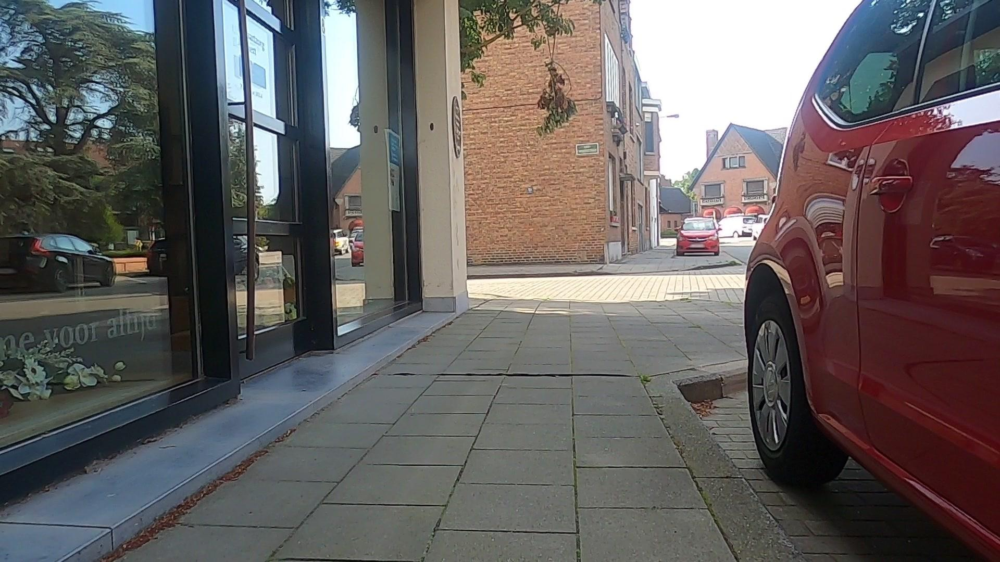

In [7]:
# Wir schauen zuerst ein Beispielbild an

example = train_ds[1]
image = example['pixel_values']
image

In [8]:
import numpy as np

# Wir lassen uns nun die Labels der Bilder ausgeben

segmentation_map = np.array(example['label'])
segmentation_map

array([[18, 18, 18, ..., 10, 10, 10],
       [18, 18, 18, ..., 10, 10, 10],
       [18, 18, 18, ..., 10, 10, 10],
       ...,
       [31, 31, 31, ..., 10, 10, 10],
       [31, 31, 31, ..., 10, 10, 10],
       [31, 31, 31, ..., 10, 10, 10]], dtype=uint8)

In [9]:
# Und nun noch die unique Labels des Datensatzes

np.unique(segmentation_map)

array([ 1,  2,  5,  7, 10, 18, 19, 20, 25, 28, 30, 31, 33], dtype=uint8)

In [10]:
# Es werden die entsprechenden Labels des Datensatzes von HuggingFace implementiert
# Alle zuvor ausgegebenen Nummern besitzen nun ein entsprechendes Label

from huggingface_hub import hf_hub_download
import json

repo_id = f"segments/sidewalk-semantic"
filename = "id2label.json"
id2label = json.load(open(hf_hub_download(repo_id, filename, repo_type="dataset"), "r"))
id2label = {int(k):v for k,v in id2label.items()}
print(id2label)

{0: 'unlabeled', 1: 'flat-road', 2: 'flat-sidewalk', 3: 'flat-crosswalk', 4: 'flat-cyclinglane', 5: 'flat-parkingdriveway', 6: 'flat-railtrack', 7: 'flat-curb', 8: 'human-person', 9: 'human-rider', 10: 'vehicle-car', 11: 'vehicle-truck', 12: 'vehicle-bus', 13: 'vehicle-tramtrain', 14: 'vehicle-motorcycle', 15: 'vehicle-bicycle', 16: 'vehicle-caravan', 17: 'vehicle-cartrailer', 18: 'construction-building', 19: 'construction-door', 20: 'construction-wall', 21: 'construction-fenceguardrail', 22: 'construction-bridge', 23: 'construction-tunnel', 24: 'construction-stairs', 25: 'object-pole', 26: 'object-trafficsign', 27: 'object-trafficlight', 28: 'nature-vegetation', 29: 'nature-terrain', 30: 'sky', 31: 'void-ground', 32: 'void-dynamic', 33: 'void-static', 34: 'void-unclear'}


Dabei handelt es sich um 34 Labels, welche für Strassenszenen relevant sind.

In [11]:
labels = [id2label[label] for label in np.unique(segmentation_map)]
print(labels)

['flat-road', 'flat-sidewalk', 'flat-parkingdriveway', 'flat-curb', 'vehicle-car', 'construction-building', 'construction-door', 'construction-wall', 'object-pole', 'nature-vegetation', 'sky', 'void-ground', 'void-static']


In [12]:
def color_palette():
    """Es wird eine Farbpalette erstellt, welche alle Labels einer bestimmten Farbe zuordnet.
    """
    return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
            [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
            [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
            [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
            [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
            [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
            [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
            [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
            [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
            [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
            [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
            [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
            [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
            [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
            [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
            [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
            [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
            [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
            [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
            [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
            [255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
            [255, 184, 184], [0, 31, 255], [0, 255, 61], [0, 71, 255],
            [255, 0, 204], [0, 255, 194], [0, 255, 82], [0, 10, 255],
            [0, 112, 255], [51, 0, 255], [0, 194, 255], [0, 122, 255],
            [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],
            [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],
            [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
            [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
            [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
            [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
            [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
            [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
            [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
            [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
            [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
            [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
            [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
            [102, 255, 0], [92, 0, 255]]

palette = color_palette()

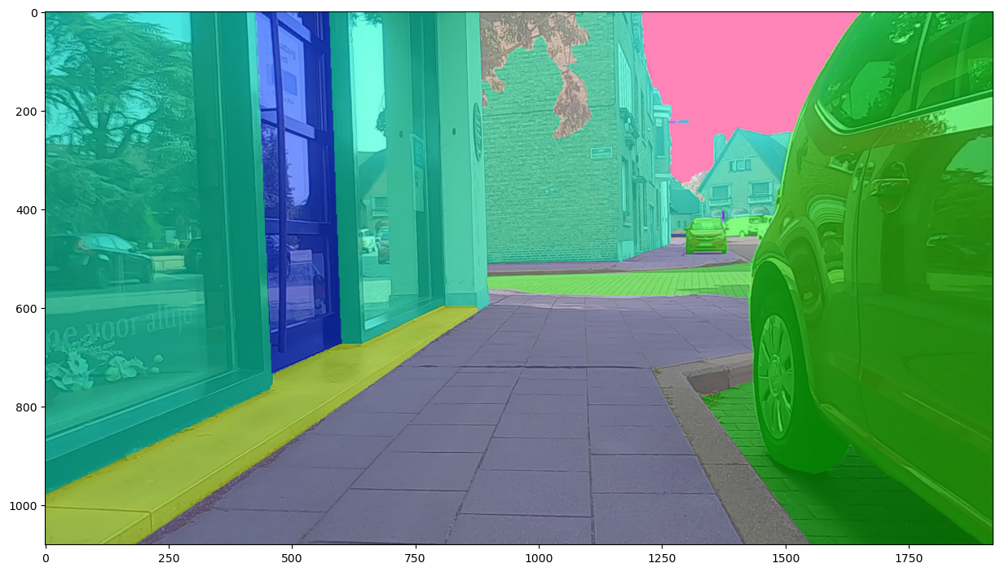

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Initialisierung einer neuen color_segmentation_map mit denselben Abmessungen wie die segmentation_map
color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3

# Iteration über die Farbpallette
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map - 1 == label, :] = color
    
# Zu BGR konvertieren
ground_truth_color_seg = color_segmentation_map[..., ::-1]

# Originalbild mit farbkodierten Segmentierungskarte kombinieren
img = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8) # in richtigem Datentyp abspeichern

# Bild anzeigen lassen
plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

Das Bild zeigt nun das Originalbild mit der darübergelegten farbkodierten Segmentierungskarte.

### Datenset erstellen

Als Nächstes wird ein Standard-PyTorch-Datensatz erstellt. Jedes Element des Datensatzes besteht aus dem Bild und der entsprechenden Ground-Truth-Map. Wir nehmen auch das Originalbild und die Map (vor der Vorverarbeitung) auf, um Metriken wie mIoU zu berechnen.

In [14]:
import numpy as np
from torch.utils.data import Dataset

class ImageSegmentationDataset(Dataset):
    """Image segmentation dataset."""

    def __init__(self, dataset, transform):
        """
        Args:
            dataset
        """
        self.dataset = dataset
        self.transform = transform
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        original_image = np.array(self.dataset[idx]['pixel_values'])
        original_segmentation_map = np.array(self.dataset[idx]['label'])

        # Wendet Transformationen (z. B. Augmentierung siehe später) auf das Bild und die Maske an
        transformed = self.transform(image=original_image, mask=original_segmentation_map)
        image, segmentation_map = transformed['image'], transformed['mask']

         # Transponiert das Bild von HxWxC nach CxHxW (notwendig für PyTorch-Modelle)
        image = image.transpose(2,0,1)

        # Gibt das transformierte Bild, die Maske, sowie die Originaldaten zurück
        return image, segmentation_map, original_image, original_segmentation_map

Hier verwenden wir Albumentations, um die Grösse zu ändern, zufällig zuzuschneiden und zu spiegeln und sie zu normalisieren. Diese Datenerweiterung soll das Modell robuster machen.

In [15]:
import albumentations as A

# Mittelwert und Standardabweichung für Normalisierung, skalieren auf [0, 1]
ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

train_transform = A.Compose([
    A.LongestMaxSize(max_size=1333), # Bild auf maximale Grösse von 1333 skalieren (ohne Verzerrung)
    A.RandomCrop(width=512, height=512),
    A.HorizontalFlip(p=0.5), # Horizontale Spiegelung mit 50% Wahrscheinlichkeit
    A.Normalize(mean=ADE_MEAN.tolist(), std=ADE_STD.tolist()), # Normalisierung Pixelwerte
])

test_transform = A.Compose([
    A.Resize(width=512, height=512), # Ebenfalls auf 512 x 512 skalieren wie Trainingsbilder
    A.Normalize(mean=ADE_MEAN.tolist(), std=ADE_STD.tolist()), # Normalisierung Pixelwerte
])

train_dataset = ImageSegmentationDataset(train_ds, transform=train_transform)
test_dataset = ImageSegmentationDataset(test_ds, transform=test_transform)

/opt/conda/lib/python3.11/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [16]:
# Damit können wir überprüfen, ob die Transformation korrekt angewendet worden ist 

image, segmentation_map, _, _ = train_dataset[0]

print(image.shape) # Form des transformierten Bildes
print(segmentation_map.shape) # Form der transformierten Segmentierungskarte

(3, 512, 512)
(512, 512)


Eine gute Möglichkeit zu überprüfen, ob die Datenerweiterungen gut funktionieren, ist die Denormalisierung der Pixelwerte. Hier führen wir also die umgekehrte Operation der Normalisierungsmethode von Albumentations durch und visualisieren das Bild:

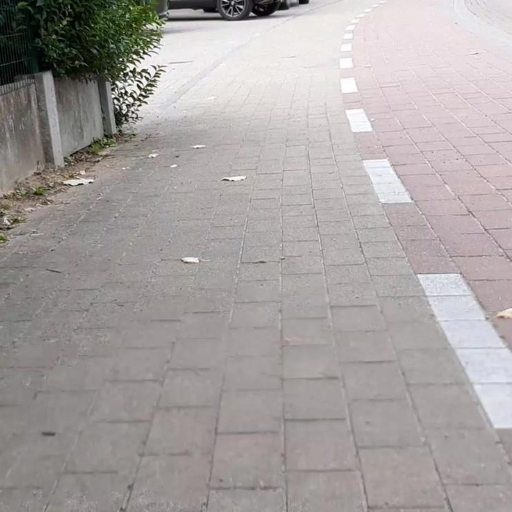

In [17]:
from PIL import Image

# Denormalisierung des Bildes: Rückgängigmachung der Normalisierung mit ADE_STD und ADE_MEAN.
unnormalized_image = (image * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]

# Skalierung der Pixelwerte von [0, 1] zurück auf den Bereich [0, 255] und Umwandlung in Ganzzahlen (uint8)
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)

# Bild zum Anzeigen in RGB-Format bringen
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

In [18]:
# Wir müssen nun auch noch sicherstellen, dass die ground trouth map korrekt ist

segmentation_map.shape

(512, 512)

In [19]:
# Labels ausgeben lassen

labels = [id2label[label] for label in np.unique(segmentation_map)]
print(labels)

['flat-road', 'flat-sidewalk', 'flat-cyclinglane', 'flat-parkingdriveway', 'flat-curb', 'vehicle-car', 'construction-wall', 'construction-fenceguardrail', 'nature-vegetation', 'nature-terrain']


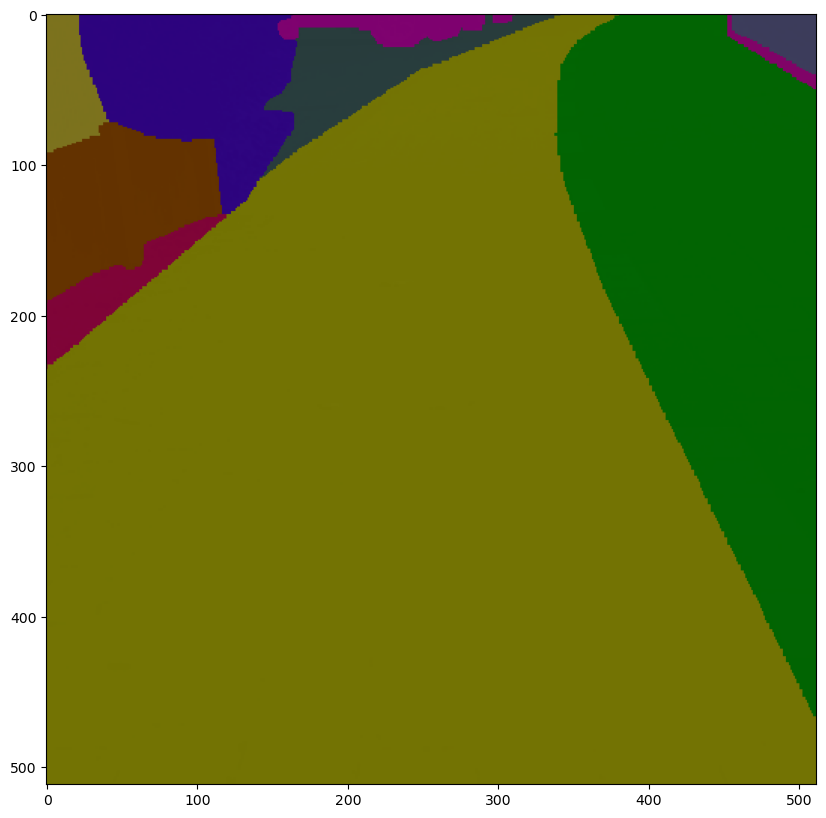

In [20]:
# Initialisierung der color_segmentation_map mit denselben Dimensionen wie die segmentation_map
# Die Matrix hat eine zusätzliche Dimension (3), um RGB-Werte zu speichern.

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette): # Iteration über Farbpalette
    color_segmentation_map[segmentation_map == label, :] = color
    
# Umwandelt von RGB zu BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.moveaxis(image, 0, -1) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

In [21]:
from transformers import MaskFormerImageProcessor

# Wir generieren einen Prepocessor
preprocessor = MaskFormerImageProcessor(ignore_index=0, reduce_labels=False, do_resize=False, do_rescale=False, do_normalize=False)

In [22]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    inputs = list(zip(*batch))
    images = inputs[0]
    segmentation_maps = inputs[1]
    
    # Die Funktion passt die Eingaben an (z. B. durch Padding) und erstellt eine Pixelmaske.
    # In diesem Fall ist Padding nicht erforderlich, da die Bilder bereits zugeschnitten wurden.
    
    batch = preprocessor(
        images,
        segmentation_maps=segmentation_maps,
        return_tensors="pt",
    )

    batch["original_images"] = inputs[2]
    batch["original_segmentation_maps"] = inputs[3]
    
    return batch

# batch_size = 2: Verarbeitet zwei Beispiele pro Batch.

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

Im Verlaufe des Trainings wurde zuerst mit einer grösseren Batch Size gestartet (batch_size = 8). Jedoch führte dies zu einem CUDA Memory Error, weshalb diese auf 4 (ebenfalls CUDA Memory Error) und schlussendlich 2 reduziert worden ist.

In [23]:
import torch

# Funktion iteriert durch die Inhalte des Batches 
# Prüft den Datentyp jedes Elements, gibt für Tensoren Form und für Listen die Form des ersten Elements aus

batch = next(iter(train_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,v[0].shape)

pixel_values torch.Size([2, 3, 512, 512])
pixel_mask torch.Size([2, 512, 512])
mask_labels torch.Size([14, 512, 512])
class_labels torch.Size([14])
original_images (1080, 1920, 3)
original_segmentation_maps (1080, 1920)


In [24]:
pixel_values = batch["pixel_values"][0].numpy()
pixel_values.shape

(3, 512, 512)

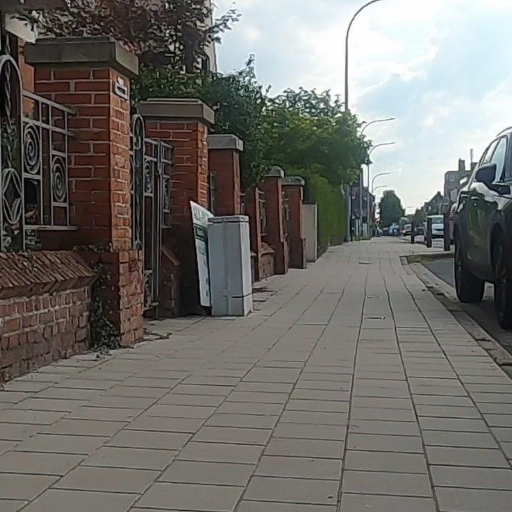

In [25]:
# Denormalisierung des Bildes: Pixelwerte werden auf ursprüngliche Skala zurückgeführt

unnormalized_image = (pixel_values * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

In [26]:
# Klassenlabel überprüfen
labels = [id2label[label] for label in batch["class_labels"][0].tolist()]
print(labels)

['flat-road', 'flat-sidewalk', 'flat-parkingdriveway', 'flat-curb', 'vehicle-car', 'construction-building', 'construction-wall', 'construction-fenceguardrail', 'object-pole', 'nature-vegetation', 'nature-terrain', 'sky', 'void-dynamic', 'void-static']


In [27]:
# Mask Labels überprüfen
batch["mask_labels"][0].shape

torch.Size([14, 512, 512])

In [28]:
def visualize_mask(labels, label_name):
  print("Label:", label_name)
  idx = labels.index(label_name)

  visual_mask = (batch["mask_labels"][0][idx].bool().numpy() * 255).astype(np.uint8)
  return Image.fromarray(visual_mask)

Label: flat-sidewalk


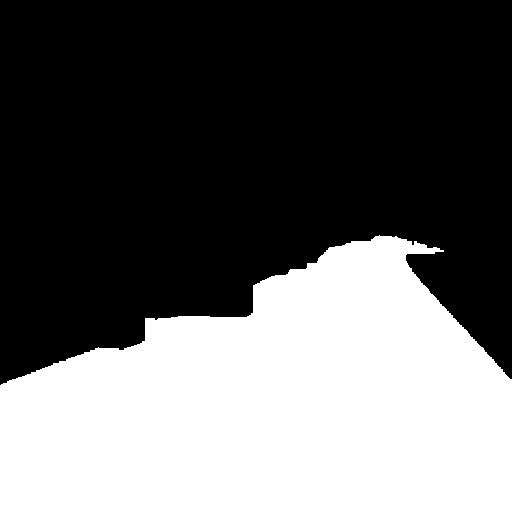

In [29]:
visualize_mask(labels, "flat-sidewalk")

### Modell definieren

In [30]:
from transformers import MaskFormerForInstanceSegmentation

# Laden eines vortrainierten MaskFormer-Modells (auf ADE20K)
model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-base-ade",
                                                          id2label=id2label,
                                                          ignore_mismatched_sizes=True)

Some weights of MaskFormerForInstanceSegmentation were not initialized from the model checkpoint at facebook/maskformer-swin-base-ade and are newly initialized because the shapes did not match:
- class_predictor.weight: found shape torch.Size([151, 256]) in the checkpoint and torch.Size([36, 256]) in the model instantiated
- class_predictor.bias: found shape torch.Size([151]) in the checkpoint and torch.Size([36]) in the model instantiated
- criterion.empty_weight: found shape torch.Size([151]) in the checkpoint and torch.Size([36]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Loss berechnen

In [31]:
outputs = model(batch["pixel_values"], # Daten: Tensor mit normalisierten Pixelwerten
                class_labels=batch["class_labels"], # Mapping der Klassen-IDs zu Klassenlabels
                mask_labels=batch["mask_labels"])

In [32]:
outputs.loss

tensor(4.4636, grad_fn=<AddBackward0>)

### Modell trainieren

In [33]:
!pip install -q evaluate

In [34]:
import evaluate

# Für die semantische Segmentierung wird die Metrik: Mean Intersection over Union (mIoU) verwendet

metric = evaluate.load("mean_iou")

In [35]:
import torch
from tqdm.auto import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)  # Verwendung des Adam-Optimizers

# Der Parameter: Early Stopping 
best_mean_iou = 0  # Initialisiere den besten Mean IoU

running_loss = 0.0
num_samples = 0
for epoch in range(20):
    print("Epoch:", epoch)
    model.train()
    for idx, batch in enumerate(tqdm(train_dataloader)):
        
        # Parameter Gradienten zurücksetzen
        optimizer.zero_grad()

        # Forward pass
        outputs = model(
            pixel_values=batch["pixel_values"].to(device),
            mask_labels=[labels.to(device) for labels in batch["mask_labels"]],
            class_labels=[labels.to(device) for labels in batch["class_labels"]],
        )

        # Backward propagation
        loss = outputs.loss
        loss.backward()

        batch_size = batch["pixel_values"].size(0)
        running_loss += loss.item()
        num_samples += batch_size

        if idx % 100 == 0:
            print("Loss:", running_loss / num_samples)

        # Optimization
        optimizer.step()

    # Evaluation
    model.eval()
    for idx, batch in enumerate(tqdm(test_dataloader)):
        
        # Forward pass
        with torch.no_grad():
            outputs = model(pixel_values=batch["pixel_values"].to(device))

        # Original Bilder erhalten
        original_images = batch["original_images"]
        target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
        
        # Segmentation maps vorhersagen
        predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(
            outputs, target_sizes=target_sizes
        )
        
        # Ground truth segmentation maps erhalten
        ground_truth_segmentation_maps = batch["original_segmentation_maps"]
        
        # IoU berechnen
        metric.add_batch(
            references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps
        )

    # Mean IoU für die aktuelle Epoche berechnen
    mean_iou = metric.compute(num_labels=len(id2label), ignore_index=0)["mean_iou"]
    print("Mean IoU:", mean_iou)

    # Early Stopping Check
    if mean_iou > best_mean_iou:
        best_mean_iou = mean_iou
        torch.save(model.state_dict(), "best_model.pth")  # Bestes Modell speichern
        print("Bestes Modell gespeichert.")
    else:
        print("Keine Verbesserung Mean IoU. Training gestoppt.")
        break


Epoch: 0


  0%|          | 0/25 [00:00<?, ?it/s]

Loss: 2.175159454345703


  0%|          | 0/100 [00:00<?, ?it/s]

/opt/conda/lib/python3.11/site-packages/datasets/features/image.py:348: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")
/home/jovyan/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/home/jovyan/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Mean IoU: 0.014965284921096006
Bestes Modell gespeichert.
Epoch: 1


  0%|          | 0/25 [00:00<?, ?it/s]

Loss: 1.6275418446614192


  0%|          | 0/100 [00:00<?, ?it/s]

Mean IoU: 0.1213965396986791
Bestes Modell gespeichert.
Epoch: 2


  0%|          | 0/25 [00:00<?, ?it/s]

Loss: 1.4395059148470561


  0%|          | 0/100 [00:00<?, ?it/s]

Mean IoU: 0.17019105807132615
Bestes Modell gespeichert.
Epoch: 3


  0%|          | 0/25 [00:00<?, ?it/s]

Loss: 1.3488066047430038


  0%|          | 0/100 [00:00<?, ?it/s]

Mean IoU: 0.1768583514923941
Bestes Modell gespeichert.
Epoch: 4


  0%|          | 0/25 [00:00<?, ?it/s]

Loss: 1.2595577529161284


  0%|          | 0/100 [00:00<?, ?it/s]

Mean IoU: 0.1831138923952406
Bestes Modell gespeichert.
Epoch: 5


  0%|          | 0/25 [00:00<?, ?it/s]

Loss: 1.1966838117629763


  0%|          | 0/100 [00:00<?, ?it/s]

Mean IoU: 0.15903580955766788
Keine Verbesserung Mean IoU. Training gestoppt.


Im Verlaufe des Trainings wurde das Modell mit unterschiedlichen Epochen und Lernraten trainiert. Die aktuellen Epochenanzahl (=20) und Lernrate (0.0005) lieferte die besten Ergebnisse.

### Inference

Nach dem Fine Tuning des MaskFormers wird auch hier ein Inference durchgeführt. Damit möchten wir die Ergebnisse des Mask2Former (pretrained gemäss HuggingFace-Modell sowie des MaskFormer (Fine Tuned) vergleichen.

In [36]:
batch = next(iter(test_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,len(v))

pixel_values torch.Size([2, 3, 512, 512])
pixel_mask torch.Size([2, 512, 512])
mask_labels 2
class_labels 2
original_images 2
original_segmentation_maps 2


In [37]:
with torch.no_grad():
  outputs = model(batch["pixel_values"].to(device))

In [38]:
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]

# Segmentation maps vorhersagen
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)

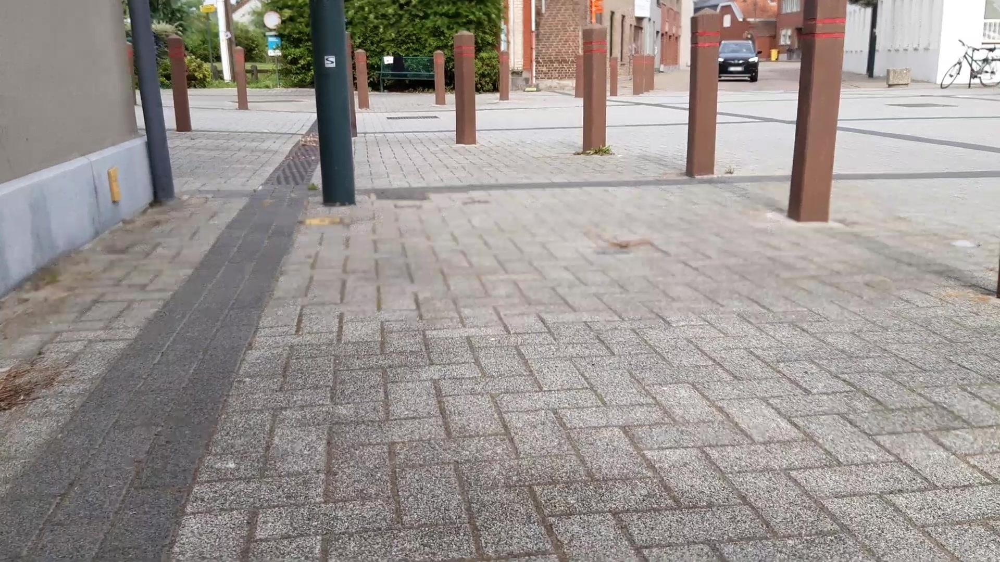

In [39]:
image = batch["original_images"][0]
Image.fromarray(image)

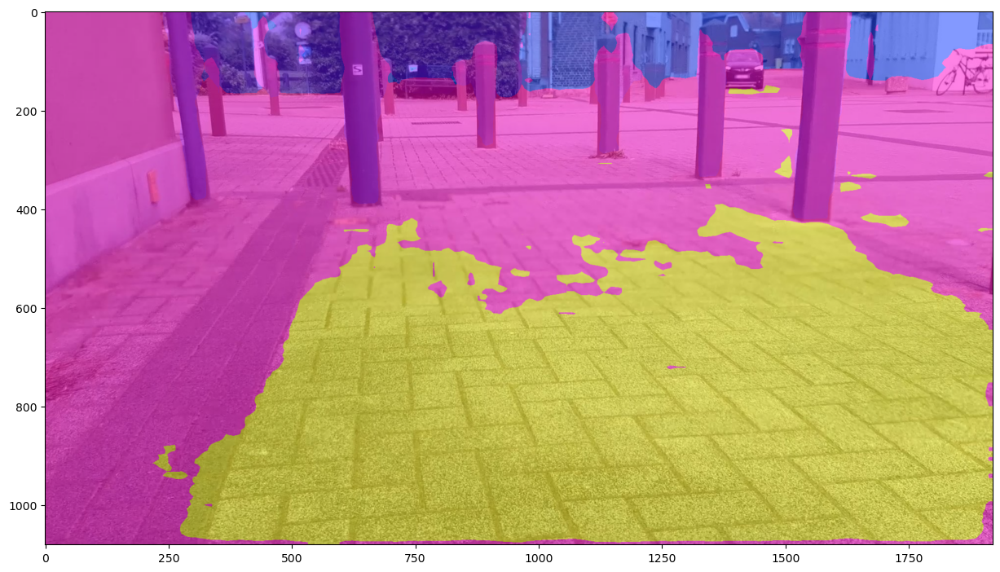

In [40]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = predicted_segmentation_maps[0].cpu().numpy()

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
    
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

Wie bereits optisch erkennt werden kann, erkennt das Modell kaum Muster. Das Bild wird nun noch mit dem Ground Truth Bild verglichen.

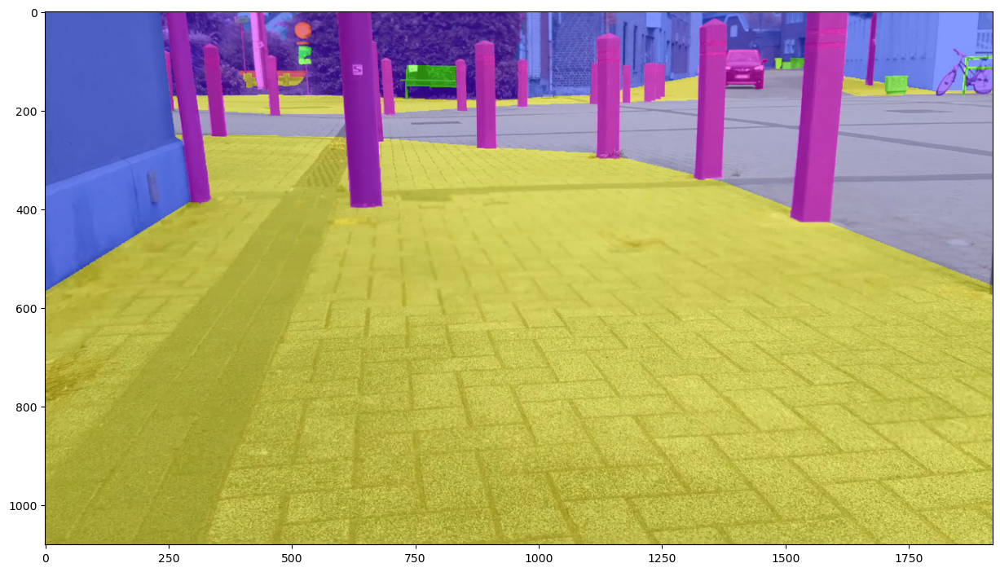

In [41]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = batch["original_segmentation_maps"][0]

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

Die Trennlinien können schlechter erkennt werden. Trotz mehreren Trainingsdurchläufen mit unterschiedlicher Lernrate, Epochs sowie Batch-Size fällt das Ergebnis schlechter aus als im Notebook: Fine Tuning MaskFormer

### Inference MaskFormer mit Mapillary Vista

Bis anhin ist das Inference mit Daten von segments/sidewalk-semantic erfolgt. Nun führen wir das Inference mit Daten von Mapillary Vista durch. Dabei werden dieselben Bilder wie auch im Notebook "Inference Mask2Former" verwendet.

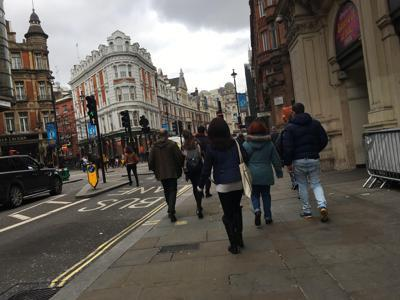

In [42]:
# Bild importieren
image_path = "strassenszene mit menschen.jpg" 
image = Image.open(image_path).convert("RGB")
image

In [43]:
inputs = preprocessor(images=image, return_tensors="pt").to(device)
inputs["pixel_values"] = inputs["pixel_values"].float().to(device)

In [44]:
with torch.no_grad():
    outputs = model(inputs["pixel_values"])

In [45]:
target_size = [(image.size[1], image.size[0])]

In [46]:
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(
    outputs, target_sizes=target_size
)

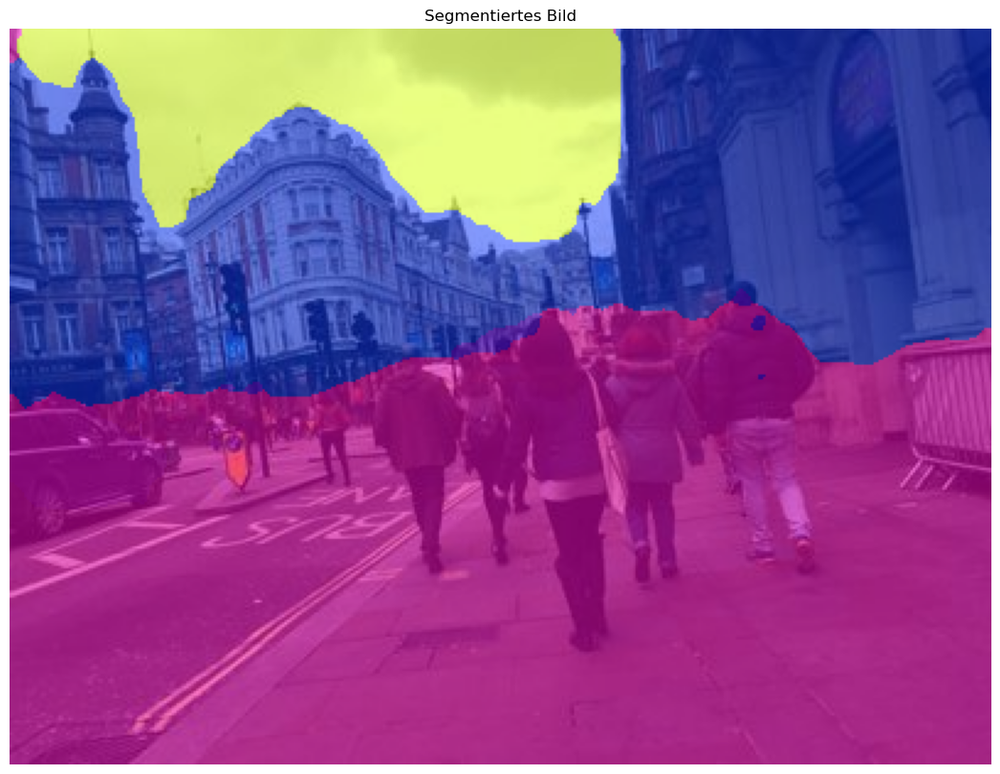

In [47]:
# Erste vorhergesagte Segmentierungsmaske extrahieren
segmentation_map = predicted_segmentation_maps[0].cpu().numpy()

# Farbige Segmentierungsmaske erstellen
color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8)
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color

# Von RGB zu BGR konvertieren
ground_truth_color_seg = color_segmentation_map[..., ::-1]

# Segmentierungsmaske mit Originalbild überlagern
blended_image = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
blended_image = blended_image.astype(np.uint8)

# Ergebnisse anzeigen
plt.figure(figsize=(15, 10))
plt.imshow(blended_image)
plt.axis("off")
plt.title("Segmentiertes Bild")
plt.show()

### Ergebnis:
Auch hier sehen wir, dass nur der obere linke Teil des Bildes vom Modell gut erkennt werden kann. Der restliche Teil wird nicht korrekt erkannt.

Nun versuchen wir das Inference noch mit einem zweiten Bild aus dem Datensatz Mapillary Vista.

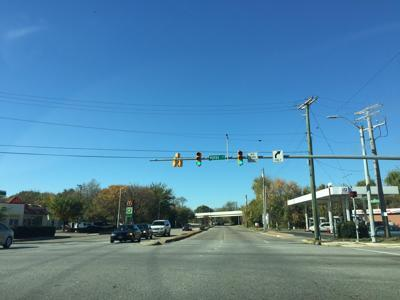

In [48]:
image_path = "verkehrssituation_mapillary_vista.jpg"  
image = Image.open(image_path).convert("RGB")
image

In [49]:
inputs = preprocessor(images=image, return_tensors="pt").to(device)
inputs["pixel_values"] = inputs["pixel_values"].float().to(device)

In [50]:
with torch.no_grad():
    outputs = model(inputs["pixel_values"])

In [51]:
target_size = [(image.size[1], image.size[0])]

In [52]:
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(
    outputs, target_sizes=target_size
)

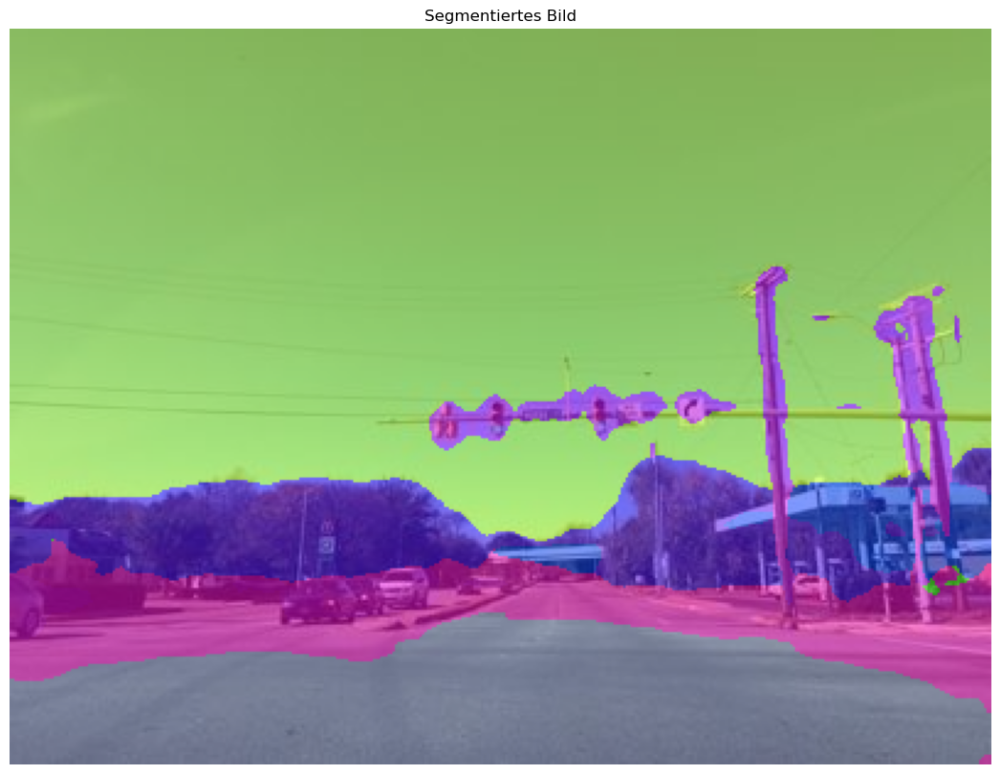

In [53]:
# Erste vorhergesagte Segmentierungsmaske extrahieren
segmentation_map = predicted_segmentation_maps[0].cpu().numpy()

# Farbige Segmentierungsmaske erstellen
color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8)
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color

# Von RGB zu BGR konvertieren
ground_truth_color_seg = color_segmentation_map[..., ::-1]

# Segmentierungsmaske mit Originalbild überlagern
blended_image = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
blended_image = blended_image.astype(np.uint8)

# Ergebnisse anzeigen
plt.figure(figsize=(15, 10))
plt.imshow(blended_image)
plt.axis("off")
plt.title("Segmentiertes Bild")
plt.show()

### Ergebnis: 

Das Ergebnis fällt ein wenig besser aus, da die Ampel erkennt werden kann. Trotzdem werden Objekte wie Autos nicht erkannt. Das Ergebnis im Notebook: Fine TuningMaskFormer ist somit besser.